In [2]:
import numpy as np 
import pandas as pd
from IPython.display import Image, display
import plotly.express as px
import random
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import log_loss

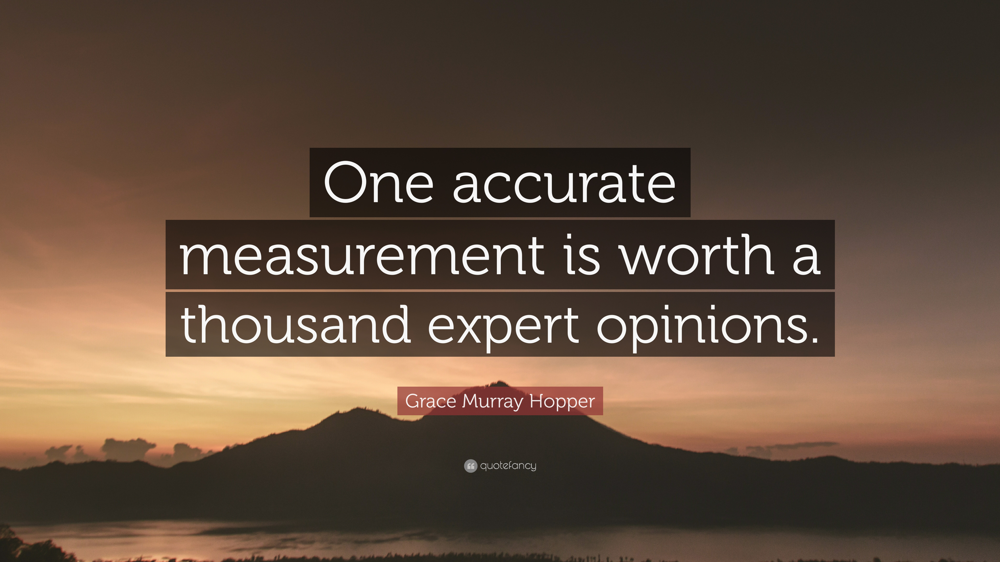

In [9]:
display(Image(filename=r"C:\Users\nati.TRANSALGAE\Python_ML_2023\images\accuracy.jpg"))

# intrudoction
<span style="font-size:20px;">For many years, the assessment of algae health and density in reactors relied on human observation and manual counting. However, advancements in technology have revolutionized this process. Today, sophisticated machines equipped with imaging capabilities can capture vast amounts of data by analyzing individual algae within a given sample. By harnessing this data and employing machine learning (ML) models, the analysis and classification of algae can be significantly expedited while achieving higher levels of accuracy. In this work, the potential of ML models for algae classification, hazard detection, and evaluating the health of a culture will be explored and elucidated.</span>


# chosen particles for classification
<span style="font-size:20px;">The algae chosen for classification is Pheodactylum, as it is a major production algae at the Baralgae facility. Each sample comprises mostly of the production algae, but also includes various other particles such as other algae, bacteria, and debris.</span>


# PT

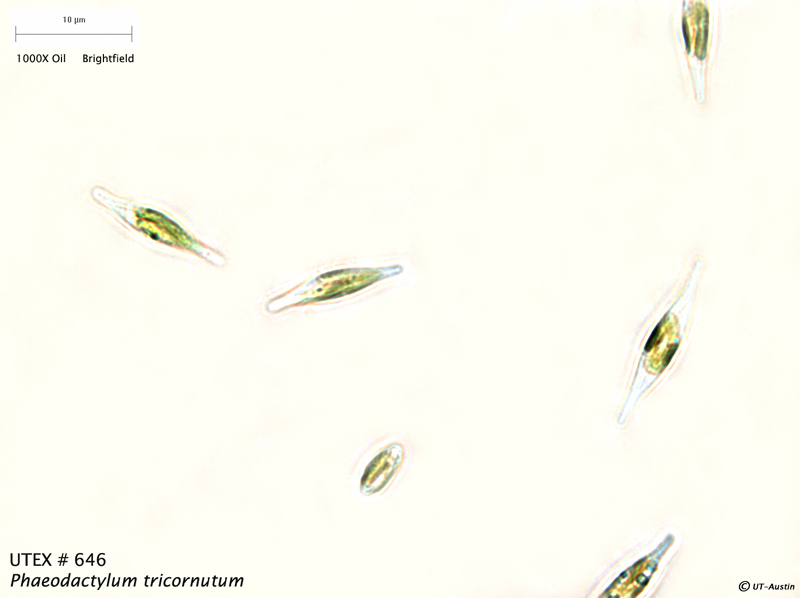

In [10]:

display(Image(filename=r'C:\Users\nati.TRANSALGAE\Python_ML_2023\images\PT.jpg'))

# particles
<span style="font-size:20px;">here are some other particles that the flowcam is capturing from the sample,
those particles are hard to classifie allthough they can tell us much about the quality and health of the culture.
every sample contains the grown agae and other particles such as other microrganisms and debries</span>

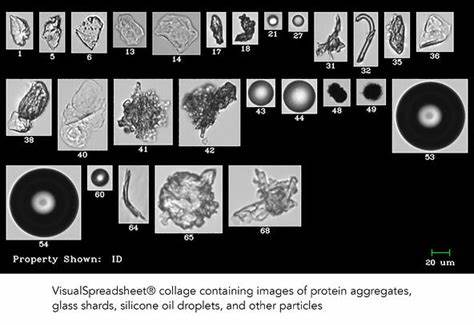

In [11]:
display(Image(filename=r"C:\Users\nati.TRANSALGAE\Python_ML_2023\images\OIP.jpg"))

# Chlorela
<span style="font-size:20px;">another algae in production to test the specifity of the models to PT
this data will be intrudoce to the model  in order to test if it overfits</span>

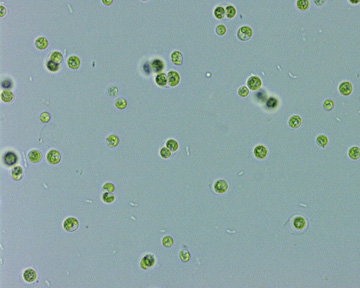

In [12]:
display(Image(filename=r'C:\Users\nati.TRANSALGAE\Python_ML_2023\images\CL.jpg'))

# Isochrysis

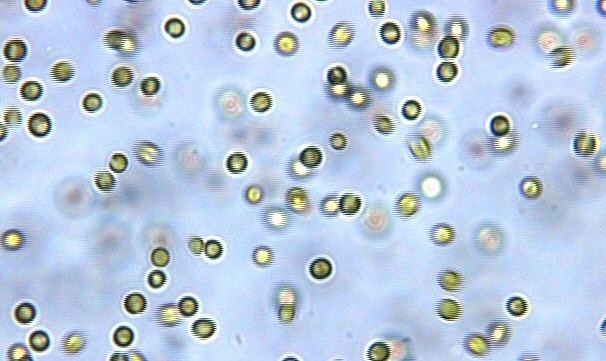

In [13]:
display(Image(filename=r"C:\Users\nati.TRANSALGAE\Python_ML_2023\images\ISO.jpeg"))

# method of using the data
# step one 
<span style="font-size:20px;">train the data on the PT sample and compare with basline</span>


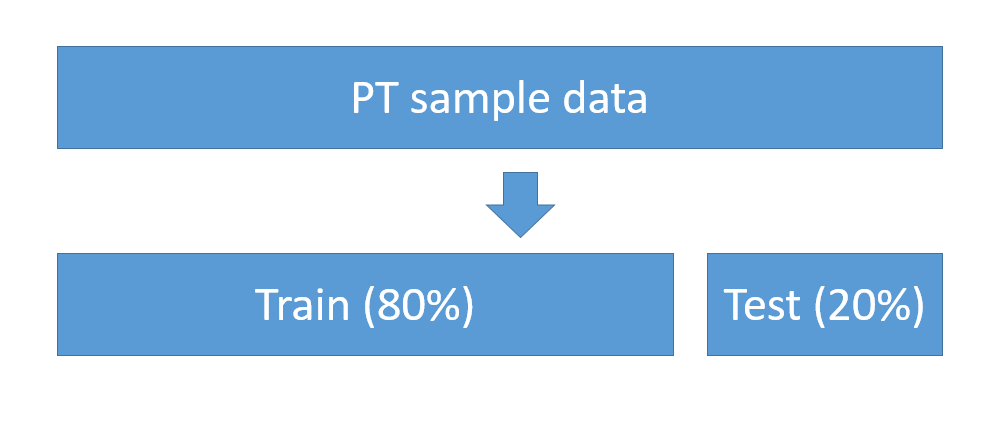

In [14]:
display(Image(filename=r"C:\Users\nati.TRANSALGAE\Python_ML_2023\images\Screenshot 2023-05-28 190216.png"))

## step 2
<span style="font-size:20px;">intrudoce two new species of algae Chlorela and isochrysis
to check for overfit and show the strength of the models in calssifing the algae</span>


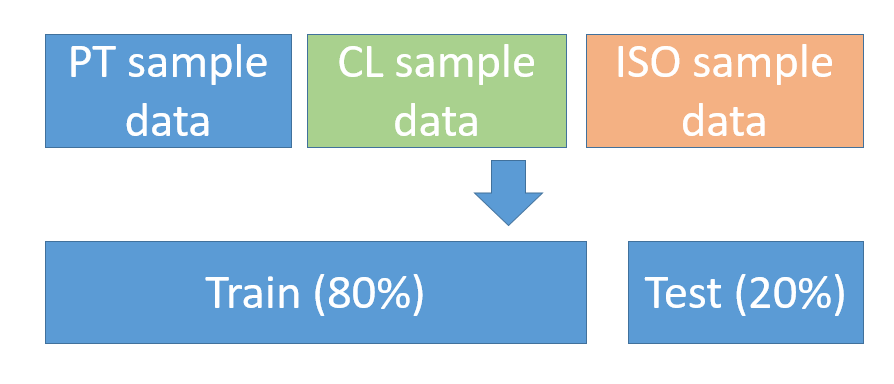

In [15]:
display(Image(filename=r"C:\Users\nati.TRANSALGAE\Python_ML_2023\images\Screenshot 2023-05-29 175901.png"))

## 

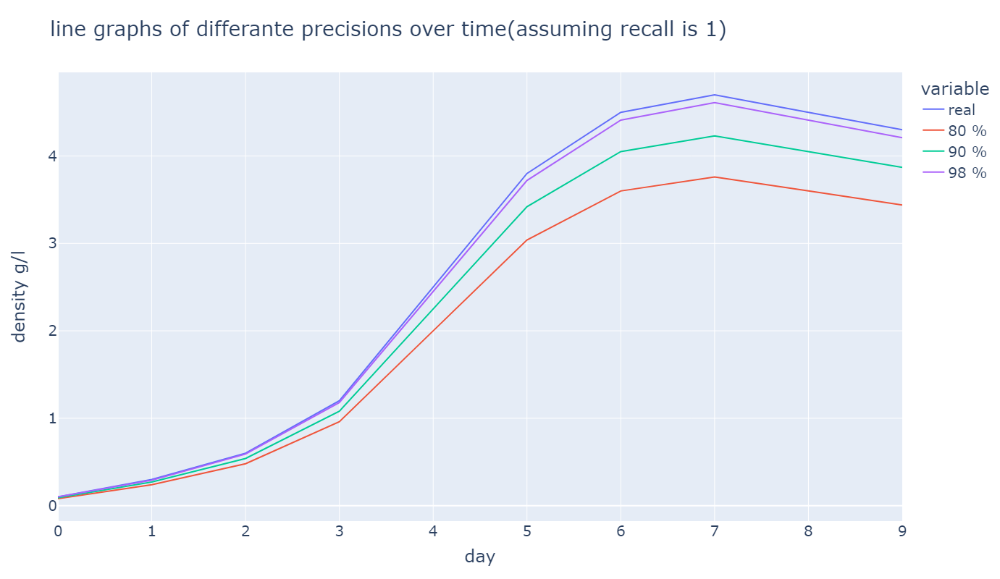

In [16]:
denstisies_in_g_l = {"Day 1": 0.1,
                     "Day 2": 0.3, 
                     "Day 3": 0.6,
                     "Day 4": 1.2,
                     "Day 5": 2.5,
                     "Day 6": 3.8,
                     "Day 7": 4.5,
                     "Day 8": 4.7, 
                     "Day 9": 4.5, 
                     "Day 10": 4.3}

# Generate random accuracy between 80% and 90%
accuracy_random_90 = []
for density in denstisies_in_g_l.values():
    accuracy = density * 0.9
    accuracy_random_90.append(round(accuracy, 2))
    
accuracy_random_98 = []
for density in denstisies_in_g_l.values():
    accuracy = density * 0.98
    accuracy_random_98.append(round(accuracy, 2))

accuracy_random_80 = []
for density in denstisies_in_g_l.values():
    accuracy = density * 0.8
    accuracy_random_80.append(round(accuracy, 2))
dic = {"real":denstisies_in_g_l.values(),"80 %":accuracy_random_80,"90 %":accuracy_random_90,"98 %":accuracy_random_98}

data = pd.DataFrame(data = dic) 
fig = px.line(data ,y=["real","80 %","90 %","98 %"],title = " line graphs of differante precisions over time(assuming recall is 1)",height = 800 )
# Update layout with x-label and y-label
fig.update_layout(
    xaxis_title="day",
    yaxis_title="density g/l",
    font=dict(
        size=20  # Set the label font size
    )
)

# Show the graph
fig.show()

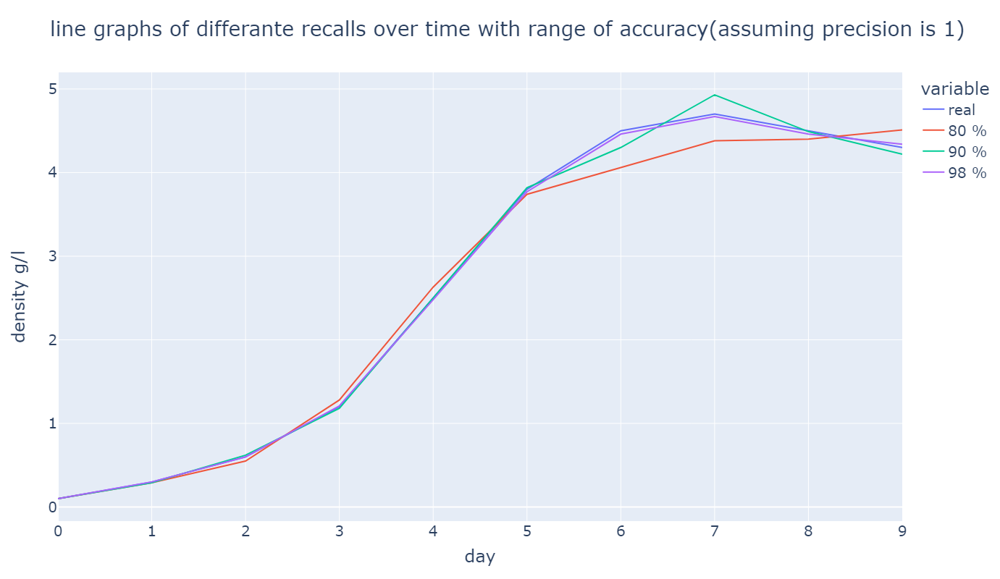

In [3]:



denstisies_in_g_l = {"Day 1": 0.1,
                     "Day 2": 0.3, 
                     "Day 3": 0.6,
                     "Day 4": 1.2,
                     "Day 5": 2.5,
                     "Day 6": 3.8,
                     "Day 7": 4.5,
                     "Day 8": 4.7, 
                     "Day 9": 4.5, 
                     "Day 10": 4.3}

# Generate random accuracy between 80% and 90%
accuracy_random_90 = []
for density in denstisies_in_g_l.values():
    accuracy = density * random.uniform(0.95, 1.05)
    accuracy_random_90.append(round(accuracy, 2))
    
accuracy_random_98 = []
for density in denstisies_in_g_l.values():
    accuracy = density * random.uniform(0.99, 1.01)
    accuracy_random_98.append(round(accuracy, 2))

accuracy_random_80 = []
for density in denstisies_in_g_l.values():
    accuracy = density * random.uniform(0.9, 1.1)
    accuracy_random_80.append(round(accuracy, 2))
dic = {"real":denstisies_in_g_l.values(),"80 %":accuracy_random_80,"90 %":accuracy_random_90,"98 %":accuracy_random_98}

data = pd.DataFrame(data = dic) 
fig = px.line(data ,y=["real","80 %","90 %","98 %"],title = " line graphs of differante recalls over time with range of accuracy(assuming precision is 1)",height = 800 )
# Update layout with x-label and y-label
fig.update_layout(
    xaxis_title="day",
    yaxis_title="density g/l",
    font=dict(
        size=20  # Set the label font size
    )
)

# Show the graph
fig.show()

# algae classifier

In [1]:
data = pd.read_csv("L:\Big_data\DATA_B\Flowcam\data exp\pt\pt_lr_2_01_21_12_22_2\pt_lr_2_1_21_12_22_2_modified.csv")
data_PT  = data.copy()
data_F = pd.read_csv("L:\Big_data\DATA_B\Flowcam\data exp\cv\cv_lr_4.2_18_12_22_2\cv lr 4.5 18.12.22 1200_modified.csv")
data_F_2 = pd.read_csv(r"C:\Users\nati.TRANSALGAE\Python_ML_2023\images\BA IG LR 3.01 05.12.22_modified.csv")
data_F = data_F.merge(data_F_2,how = "outer")
data_F["algae_bool"] = 0
data = data.merge(data_F,how = "outer")

NameError: name 'pd' is not defined

In [19]:
class display(object):
    """Display HTML representation of multiple objects"""
    template = """<div style="float: left; padding: 10px;">
    <p style='font-family:"Courier New", Courier, monospace'>{0}</p>{1}
    </div>"""
    def __init__(self, *args):
        self.args = args
        
    def _repr_html_(self):
        return '\n'.join(self.template.format(a, eval(a)._repr_html_())
                         for a in self.args)
    
    def __repr__(self):
        return '\n\n'.join(a + '\n' + repr(eval(a))
                           for a in self.args)

## droping all data that doesnot contain class

In [20]:
mask = (data.algae_bool == 0) | (data.algae_bool == 1)
data = data[mask]
data_PT = data_PT[mask]

C:\Users\nati.TRANSALGAE\AppData\Local\Temp\ipykernel_23404\3486232603.py:3: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



## tabeling the target

In [21]:
table = data_PT.algae_bool.value_counts()
ratio = "{:.3}".format(1466/(1466+456))
print(table,"\n","ratio between algae and nonalgae is " + ratio)

1.0    1466
0.0     456
Name: algae_bool, dtype: int64 
 ratio between algae and nonalgae is 0.763


In [22]:
table = data.algae_bool.value_counts()
ratio = "{:.3}".format(1466/(1466+6546))
print(table,"\n","ratio between algae and nonalgae is " + ratio)

0.0    6456
1.0    1466
Name: algae_bool, dtype: int64 
 ratio between algae and nonalgae is 0.183


# Droping the data for ML modeling

## prepperation for scaling
1. removing features as ID 
2. removing catagorical
3. seperating the target feature

In [23]:
################## 1 #####################

del data["Particle ID"]
del data_PT["Particle ID"]
del data_F["Particle ID"]

In [24]:
################# 2 #####################
del data["algae_num"]
del data["Feret Angle Max"]
del data["Feret Angle Min"]
del data_PT["Feret Angle Max"]
del data_PT["Feret Angle Min"]
del data_PT['Filter Score']
del data['Filter Score']
del data_F["Feret Angle Max"]
del data_F["Feret Angle Min"]
del data_F['Filter Score']

In [25]:
# data = data.merge(data_F,how = "outer")
#data = data.dropna()

In [26]:
######### 3 ###################
data_x,data_y = x, y = data[data.columns[:-1]], data['algae_bool']
data_x_f,data_y_f = x_f, y_f = data_F[data_PT.columns[:-1]], data_F['algae_bool']
data_x_PT,data_y_PT = x_PT, y_PT = data_PT[data_PT.columns[:-1]], data_PT['algae_bool']
dependent = data['algae_bool']

# baseline model for comparison


# comparing to given filter in the machine
## PT filters ranges
1. Diameter           = (3.49     - 31.4465 )
2. Elongation        = (1.000    - 32.0651 )
3. Fiber straightness = (0.425    - 1.3599  )
4. Intensity          = (131.6416 - 236.5659)
5. Length             = (3.3673   - 48.5861 )
6. Transperency       = (0.0334   - 0.7519  )
7. Width              = (0.9621   - 18.1196 )

In [236]:
cond =  [(data["Diameter (ESD)"]      >= 3.49)     &
         (data["Diameter (ESD)"]      <= 31.4465)  &
         (data["Elongation"]          >= 1.000)    &
         (data["Elongation"]          <= 32.0651)  &
         (data["Fiber Straightness"]  >= 0.425)    &
         (data["Fiber Straightness"]  <= 1.3599)   &
         (data["Intensity"]           >= 131.6416) &
         (data["Intensity"]           <= 236.5659) &
         (data["Length"]              >= 3.3673)   &
         (data["Length"]              <= 48.5861)  &
         (data["Transparency"]        >= 0.0334)   &
         (data["Transparency"]        <= 0.7519)   &
         (data["Width"]               >= 0.9621)   &
         (data["Width"]               <= 18.1196)] 

cond_PT =  [(data_PT["Diameter (ESD)"]      >= 3.49)     &
            (data_PT["Diameter (ESD)"]      <= 31.4465)  &
            (data_PT["Elongation"]          >= 1.000)    &
            (data_PT["Elongation"]          <= 32.0651)  &
            (data_PT["Fiber Straightness"]  >= 0.425)    &
            (data_PT["Fiber Straightness"]  <= 1.3599)   &
            (data_PT["Intensity"]           >= 131.6416) &
            (data_PT["Intensity"]           <= 236.5659) &
            (data_PT["Length"]              >= 3.3673)   &
            (data_PT["Length"]              <= 48.5861)  &
            (data_PT["Transparency"]        >= 0.0334)   &
            (data_PT["Transparency"]        <= 0.7519)   &
            (data_PT["Width"]               >= 0.9621)   &
            (data_PT["Width"]               <= 18.1196)]

cond_F =  [(data_F["Diameter (ESD)"]      >= 3.49)     &
            (data_F["Diameter (ESD)"]      <= 31.4465)  &
            (data_F["Elongation"]          >= 1.000)    &
            (data_F["Elongation"]          <= 32.0651)  &
            (data_F["Fiber Straightness"]  >= 0.425)    &
            (data_F["Fiber Straightness"]  <= 1.3599)   &
            (data_F["Intensity"]           >= 131.6416) &
            (data_F["Intensity"]           <= 236.5659) &
            (data_F["Length"]              >= 3.3673)   &
            (data_F["Length"]              <= 48.5861)  &
            (data_F["Transparency"]        >= 0.0334)   &
            (data_F["Transparency"]        <= 0.7519)   &
            (data_F["Width"]               >= 0.9621)   &
            (data_F["Width"]               <= 18.1196)]


cond = np.array(cond).astype(int)
cond_F = np.array(cond_F).astype(int)
cond_PT = np.array(cond_PT).astype(int)

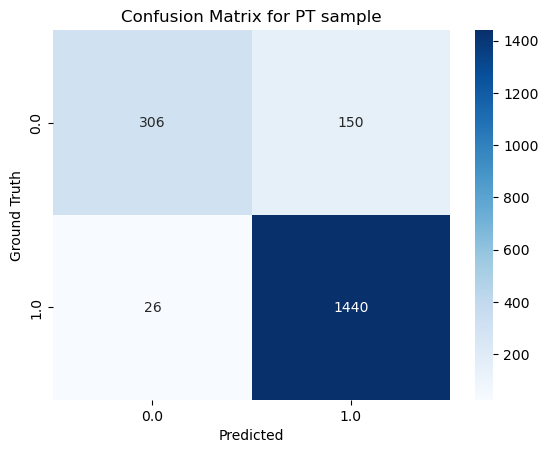

In [237]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Example ground truth and predicted labels
ground_truth = data_y_PT
predicted =cond_PT.tolist()[0]

# Create confusion matrix
cm = confusion_matrix(ground_truth, predicted)

# Create labels for the matrix
labels = np.unique(ground_truth)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix for PT sample')
plt.xlabel('Predicted')
plt.ylabel('Ground Truth')
plt.show()

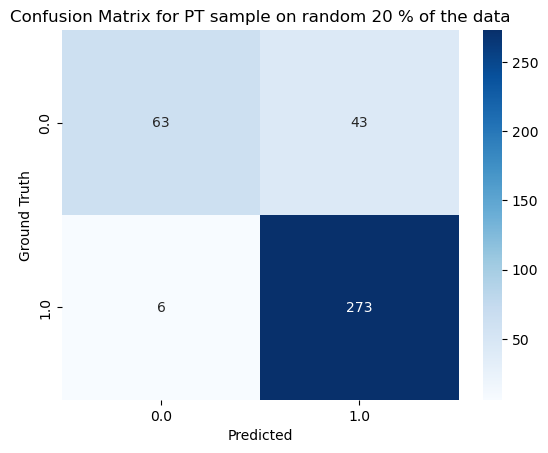

In [294]:
# Example ground truth and predicted labels
import random
n = 385
ground_truth = data_y_PT[200:585]
predicted = cond_PT.tolist()[0][200:585]

# Create confusion matrix
cm = confusion_matrix(ground_truth, predicted)

# Create labels for the matrix
labels = np.unique(ground_truth)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix for PT sample on random 20 % of the data')
plt.xlabel('Predicted')
plt.ylabel('Ground Truth')
plt.show()

# overfit test
<span style="font-size:20px;">Checking the combined data of PT,CV and ISO samples to test the abbility of the model to filter the PT instences from the data.
as can be seen the model is not specific to the PT.

In [238]:
from sklearn.metrics import confusion_matrix
tn, fp, fn, tp = confusion_matrix(data_y, cond.tolist()[0]).ravel()
print(tn,fp,fn,tp)

1434 5022 26 1440


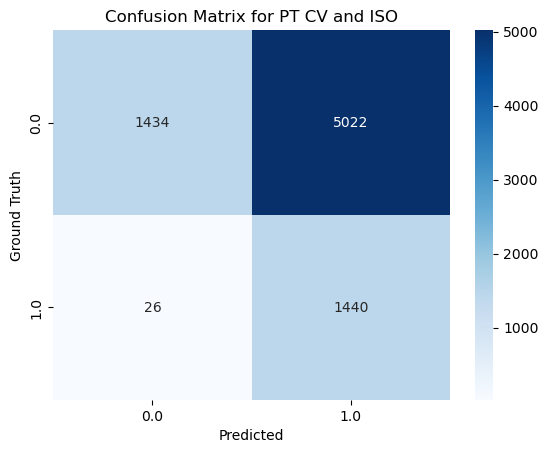

In [239]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Example ground truth and predicted labels
ground_truth = data_y
predicted =cond.tolist()[0]

# Create confusion matrix
cm = confusion_matrix(ground_truth, predicted)

# Create labels for the matrix
labels = np.unique(ground_truth)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix for PT CV and ISO')
plt.xlabel('Predicted')
plt.ylabel('Ground Truth')
plt.show()

In [240]:
accuracy = (tn+tp)/(tn+fp+fn+tp)
accuracy

0.36278717495581925

In [241]:
#F1 score
import sklearn.metrics
sklearn.metrics.f1_score(data_y, cond.tolist()[0])

0.36326942482341074

In [92]:
tn_F, fp_F, fn_F, tp_F = confusion_matrix(data_y_f, cond_F.tolist()[0]).ravel()
print(tn_F,fp_F,fn_F,tp_F)


1128 4872 0 0


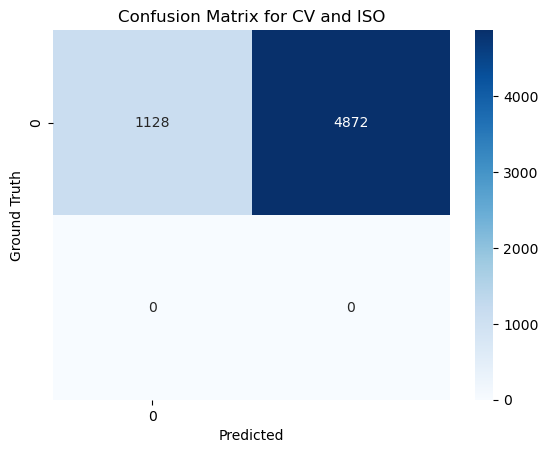

In [93]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Example ground truth and predicted labels
ground_truth = data_y_f
predicted =cond_F.tolist()[0]

# Create confusion matrix
cm = confusion_matrix(ground_truth, predicted)

# Create labels for the matrix
labels = np.unique(ground_truth)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix for CV and ISO')
plt.xlabel('Predicted')
plt.ylabel('Ground Truth')
plt.show()

In [560]:
accuracy_F = (tn_F+tp_F)/(tn_F+fp_F+fn_F+tp_F)
accuracy_F

0.188

In [561]:
#F1 score
import sklearn.metrics
sklearn.metrics.f1_score(data_y_f, cond_F.tolist()[0])

0.0

In [562]:
accuracy_PT = (tn_PT+tp_PT)/(tn_PT+fp_PT+fn_PT+tp_PT)
F1_PT = 2*tp_PT/(2*tp_PT+fn_PT+fp_PT)
recall = tp_PT/(tp_PT+fn_PT)
precision = tp_PT/(tp_PT+fp_PT)
accuracy_PT,F1_PT,recall,precision

(0.9084287200832466,
 0.9424083769633508,
 0.9822646657571623,
 0.9056603773584906)

In [563]:
#F1 score
import sklearn.metrics
sklearn.metrics.f1_score(data_y_PT, cond_PT.tolist()[0])

0.9424083769633508

# scaling methods

## StandardScaler
data_std_scaled_pd = (data - data.mean()) / data.std()

## MinMaxScaler
data_min_max_scaled_pd = (data - data.min()) / (data.max() - data.min())

## RobustScaler
data_robust_scaled_pd = (data - data.median()) / (data.quantile(0.75) - data.quantile(0.25))

In [564]:
# data
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn import set_config
set_config(transform_output="pandas")

# StandardScaler
std_scaler = StandardScaler()
std_scaler.fit(data_x)
data_std_scaled = std_scaler.transform(data_x)

# MinMaxScaler
min_max_scaler = MinMaxScaler()
data_min_max_scaled = min_max_scaler.fit_transform(data_x)

# RobustScaler
robust_scaler = RobustScaler()
data_robust_scaled = robust_scaler.fit_transform(data_x)

# data_F

# StandardScaler
std_scaler = StandardScaler()
std_scaler.fit(data_x_f)
data_std_scaled_F = std_scaler.transform(data_x_f)

# MinMaxScaler
min_max_scaler = MinMaxScaler()
data_min_max_scaled_F = min_max_scaler.fit_transform(data_x_f)

# RobustScaler
robust_scaler = RobustScaler()
data_robust_scaled_F = robust_scaler.fit_transform(data_x_f)

# creating an heatmap to see corolations within the data


In [565]:
# generating pairwise correlation
corr = data_x.corr()
  
# Displaying dataframe as an heatmap 
# with diverging colourmap as coolwarm
corr.style.background_gradient(cmap ='coolwarm')

,Area (ABD),Area (Filled),Aspect Ratio,Average Blue,Average Green,Average Red,Biovolume (Cylinder),Biovolume (P. Spheroid),Biovolume (Sphere),Circle Fit,Circularity,Circularity (Hu),Compactness,Convex Perimeter,Convexity,Diameter (ABD),Diameter (ESD),Diameter (FD),Edge Gradient,Elongation,Fiber Curl,Fiber Straightness,Geodesic Aspect Ratio,Geodesic Length,Geodesic Thickness,Image Height,Image Width,Intensity,Length,Particles Per Chain,Perimeter,Ratio Blue/Green,Ratio Red/Blue,Ratio Red/Green,Roughness,Sigma Intensity,Sum Intensity,Symmetry,Transparency,Volume (ABD),Volume (ESD),Width
Area (ABD),1.000000,0.999958,-0.275238,-0.155617,-0.261783,-0.339436,0.943297,0.889465,0.914630,-0.489107,-0.404247,-0.267190,0.336658,0.875720,-0.358500,0.901652,0.876678,0.901720,0.088343,0.341353,0.102811,-0.182710,-0.406171,0.846613,0.604223,0.818729,0.764447,-0.243757,0.829877,-0.000921,0.889360,0.051578,-0.114881,-0.241276,-0.110030,0.412519,0.983028,-0.230294,0.148066,0.914721,0.863417,0.867629
Area (Filled),0.999958,1.000000,-0.275179,-0.155449,-0.261574,-0.339190,0.943343,0.889419,0.914566,-0.488994,-0.404144,-0.267112,0.336559,0.875654,-0.358386,0.901547,0.876612,0.901654,0.088221,0.341257,0.102779,-0.182674,-0.406072,0.846536,0.604171,0.818534,0.764560,-0.243549,0.829832,-0.000930,0.889280,0.051609,-0.114879,-0.241186,-0.109984,0.412305,0.983100,-0.230203,0.148083,0.914657,0.863462,0.867542
Aspect Ratio,-0.275238,-0.275179,1.000000,-0.144278,-0.230683,-0.231395,-0.129013,-0.089542,-0.152797,0.884205,0.766057,0.927817,-0.695960,-0.464434,0.437335,-0.318289,-0.466649,-0.318272,0.128042,-0.704286,-0.168316,0.268260,0.741624,-0.555069,0.206418,-0.447569,-0.380050,-0.210315,-0.579296,-0.138768,-0.453620,0.044737,-0.017511,0.060180,-0.039409,0.122279,-0.334290,0.428056,-0.802566,-0.152846,-0.226335,-0.016229
Average Blue,-0.155617,-0.155449,-0.144278,1.000000,0.819116,0.706926,-0.178291,-0.135690,-0.127454,-0.071534,-0.102024,-0.234757,0.141639,-0.145186,-0.073978,-0.211138,-0.141816,-0.211058,-0.388198,0.167122,0.224631,-0.259783,-0.140159,-0.065513,-0.383071,-0.127903,-0.140334,0.915831,-0.095661,0.045148,-0.141086,0.686391,-0.712695,-0.638599,0.291173,-0.274162,-0.113935,-0.143154,0.239262,-0.127463,-0.074377,-0.265989
Average Green,-0.261783,-0.261574,-0.230683,0.819116,1.000000,0.970218,-0.253788,-0.179989,-0.177647,-0.082125,-0.165424,-0.308830,0.197768,-0.287262,-0.105745,-0.387250,-0.283434,-0.387144,-0.476799,0.215557,0.340519,-0.358932,-0.184615,-0.155077,-0.614533,-0.264568,-0.252881,0.980240,-0.211549,0.079266,-0.271172,0.148018,-0.204835,-0.375049,0.498768,-0.504479,-0.242955,-0.259023,0.389897,-0.177677,-0.120629,-0.449657
Average Red,-0.339436,-0.339190,-0.231395,0.706926,0.970218,1.000000,-0.321321,-0.232869,-0.232815,-0.058742,-0.142370,-0.295018,0.181050,-0.359289,-0.082297,-0.468905,-0.355915,-0.468785,-0.469587,0.195699,0.322506,-0.322620,-0.150459,-0.217950,-0.681393,-0.332796,-0.314177,0.924633,-0.274638,0.081817,-0.341945,-0.009790,-0.016338,-0.140527,0.502441,-0.573082,-0.324937,-0.237074,0.394340,-0.232858,-0.167977,-0.537514
Biovolume (Cylinder),0.943297,0.943343,-0.129013,-0.178291,-0.253788,-0.321321,1.000000,0.935505,0.963497,-0.283393,-0.239916,-0.112145,0.179611,0.696783,-0.220156,0.756305,0.697708,0.756430,0.078011,0.180015,0.074473,-0.117559,-0.246821,0.654389,0.583519,0.654824,0.604081,-0.245681,0.637501,-0.017268,0.712460,0.000085,-0.061024,-0.201937,-0.065588,0.331570,0.876687,-0.136623,0.034221,0.963507,0.844154,0.773179
Biovolume (P. Spheroid),0.889465,0.889419,-0.089542,-0.135690,-0.179989,-0.232869,0.935505,1.000000,0.977933,-0.237263,-0.228699,-0.111025,0.214952,0.614119,-0.279758,0.643988,0.615193,0.644078,0.038757,0.217137,0.162704,-0.175201,-0.223597,0.622982,0.423773,0.585887,0.525213,-0.178196,0.558304,0.004599,0.649959,-0.018681,-0.032747,-0.163650,0.053810,0.232712,0.813180,-0.182304,0.068012,0.977906,0.922987,0.702690
Biovolume (Sphere),0.914630,0.914566,-0.152797,-0.127454,-0.177647,-0.232815,

# Pipelines

In [242]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression


In [27]:
#create data of scaled data + target data
#data = data_std_scaled
data_x,data_y = x, y = data[data.columns[:-1]], dependent
X_train, X_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=42)

# data False split
data_x_F,data_y_F = x_f, y_f = data_F[data_F.columns[:-1]], data_F["algae_bool"]
X_F_train, X_F_test, y_F_train, y_F_test = train_test_split(x_f,y_f, test_size=0.2, random_state=42)

#data PT split
data_x_PT,data_y_PT = x_PT, y_PT = data_PT[data_PT.columns[:-2]], data_PT["algae_bool"]
X_PT_train, X_PT_test, y_PT_train, y_PT_test = train_test_split(x_PT,y_PT, test_size=0.2, random_state=42)

# pipline test

## logistic regression

In [244]:
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import log_loss

In [245]:
# Pipeline without PolynomialFeatures
pipeline_no_poly = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('dimension_reduction', PCA()),
    ('classifier', LogisticRegression(solver='lbfgs',max_iter=1000, random_state=42))
])
# Pipeline with PolynomialFeatures
pipeline_poly = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('polynomial_expension', PolynomialFeatures(degree=2)),
    ('dimension_reduction', PCA()),
    ('classifier', LogisticRegression(solver='lbfgs',max_iter=1000, random_state=42))
])

In [570]:
param_grid = [
    {
        'dimension_reduction__n_components': [2,3,4],
        'classifier__penalty': ['l2'],
        'classifier__C': [0.1,1, 10, 50, 100, 150, 200],
    }
]

In [571]:
grid_search = GridSearchCV(pipeline_poly, param_grid, scoring='accuracy', cv=10, n_jobs=-1, verbose=2,error_score ="raise")
grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 21 candidates, totalling 210 fits


GridSearchCV(cv=10, error_score='raise',
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('polynomial_expension',
                                        PolynomialFeatures()),
                                       ('dimension_reduction', PCA()),
                                       ('classifier',
                                        LogisticRegression(random_state=42,
                                                           solver='liblinear'))]),
             n_jobs=-1,
             param_grid=[{'classifier__C': [0.1, 1, 10, 50, 100, 150, 200],
                          'classifier__penalty': ['l2'],
                          'dimension_reduction__n_components': [2, 3, 4]}],
             scoring='accuracy', verbose=2)

In [154]:
cv_results_df = pd.DataFrame(grid_search.cv_results_)
# cv_results_df.columns.tolist()

In [573]:
cols = ['param_classifier__C', 'param_classifier__penalty','param_dimension_reduction__n_components', 'mean_test_score']
cv_results_df.sort_values(by = 'mean_test_score', ascending=False)[cols].head(20)

,param_classifier__C,param_classifier__penalty,param_dimension_reduction__n_components,mean_test_score
20,200,l2,4,0.885279
5,1,l2,4,0.885279
17,150,l2,4,0.885279
8,10,l2,4,0.885279
14,100,l2,4,0.885279
11,50,l2,4,0.885279
2,0.1,l2,4,0.885121
4,1,l2,3,0.862079
1,0.1,l2,3,0.862079
13,100,l2,3,0.861764


In [574]:
param_grid = [
    {
        'dimension_reduction__n_components': [2,3],
        'classifier__penalty': ['l1', 'l2'],
        'classifier__C': [0.01, 0.1, 1, 10, 100],
        'classifier__solver': ['liblinear']
    },
    {
        'dimension_reduction': ['passthrough'],
        'classifier__penalty': ['l1', 'l2'],
        'classifier__C': [0.01, 0.1, 1, 10, 100],
        'classifier__solver': ['liblinear']
    }
]

In [575]:
grid_search = GridSearchCV(pipeline_poly, param_grid, scoring='accuracy', cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('polynomial_expension',
                                        PolynomialFeatures()),
                                       ('dimension_reduction', PCA()),
                                       ('classifier',
                                        LogisticRegression(random_state=42,
                                                           solver='liblinear'))]),
             n_jobs=-1,
             param_grid=[{'classifier__C': [0.01, 0.1, 1, 10, 100],
                          'classifier__penalty': ['l1', 'l2'],
                          'classifier__solver': ['liblinear'],
                          'dimension_reduction__n_components': [2, 3]},
                         {'classifier__C': [0.01, 0.1, 1, 10, 100],
                          'classifier__penalty': ['l1', 'l2'],
                          'classifier__solver': ['liblinear'],
                          'dimension_reduction': ['passthrough']}],
             scoring='accuracy', verbose=2)

In [576]:
cols = ['param_classifier__C', 'param_classifier__penalty','param_dimension_reduction__n_components', 'mean_test_score', 'param_dimension_reduction']
cv_results_df = pd.DataFrame(grid_search.cv_results_)
cv_results_df.sort_values(by = 'mean_test_score', ascending=False)[cols].head(10)

,param_classifier__C,param_classifier__penalty,param_dimension_reduction__n_components,mean_test_score,param_dimension_reduction
24,1,l1,NaN,0.978224,passthrough
23,0.1,l2,NaN,0.977434,passthrough
21,0.01,l2,NaN,0.976961,passthrough
25,1,l2,NaN,0.976803,passthrough
22,0.1,l1,NaN,0.976803,passthrough
27,10,l2,NaN,0.976329,passthrough
29,100,l2,NaN,0.975067,passthrough
26,10,l1,NaN,0.973173,passthrough
28,100,l1,NaN,0.968596,passthrough
20,0.01,l1,NaN,0.961022,passthrough


In [250]:
# Fit the pipelines to the training data
pipeline_poly.param_classifier__C = 1
pipeline_poly.param_classifier__penalty = "l1"
pipeline_poly.param_dimension_reduction = "passthrough"
pipeline_poly.param_dimension_reduction = "passthrough"

pipeline_no_poly.param_classifier__C = 0.1
pipeline_no_poly.param_classifier__penalty = "l2"
pipeline_no_poly.param_dimension_reduction = "passthrough"

#fit pipline to the merged data
pipeline_no_poly_data = pipeline_no_poly.fit(X_train, y_train)
pipeline_poly_data = pipeline_poly.fit(X_train, y_train)

# Evaluate the pipelines on the test data
accuracy_no_poly = pipeline_no_poly_data.score(X_test, y_test)
accuracy_poly = pipeline_poly_data.score(X_test, y_test)

# from sklearn.metrics import log_loss
# cost = log_loss(y_test, pred_no_poly)

# Evaluate the pipelines on the false data
accuracy_no_poly_f = pipeline_no_poly.score(X_F_train,y_F_train)
accuracy_poly_f = pipeline_poly.score(X_F_train, y_F_train)

# predict the results by the model for the merged data
pred_no_poly = pipeline_no_poly.predict(X_test)
pred_poly = pipeline_poly.predict(X_test)
pred_copy = pred_poly.copy()
# PT data on the full data reg polynomial 
pred_poly_ALL_on_PT = pipeline_poly.predict(X_PT_test)

# from sklearn.metrics import log_loss
# cost = log_loss(y_test, pred_no_poly)


#F1 scores
F1_data_no_poly = sklearn.metrics.f1_score(y_test, pred_no_poly)
F1_data_poly = sklearn.metrics.f1_score(y_test, pred_poly)



#fit the piplines to the pt data
pipeline_no_poly_PT = pipeline_no_poly.fit(X_PT_train, y_PT_train)
pipeline_poly_PT =pipeline_poly.fit(X_PT_train, y_PT_train)

# Evaluate the pipelines on the test data
accuracy_no_poly_PT = pipeline_no_poly_PT.score(X_PT_test, y_PT_test)
accuracy_poly_PT = pipeline_poly_PT.score(X_PT_test, y_PT_test)

# predict the results by the model for the merged data
pred_no_poly = pipeline_no_poly_PT.predict(X_PT_test)
pred_poly = pipeline_poly_PT.predict(X_PT_test)

#F1 scores
F1_PT_no_poly = sklearn.metrics.f1_score(y_PT_test, pred_no_poly)
F1_PT_poly = sklearn.metrics.f1_score(y_PT_test, pred_poly)



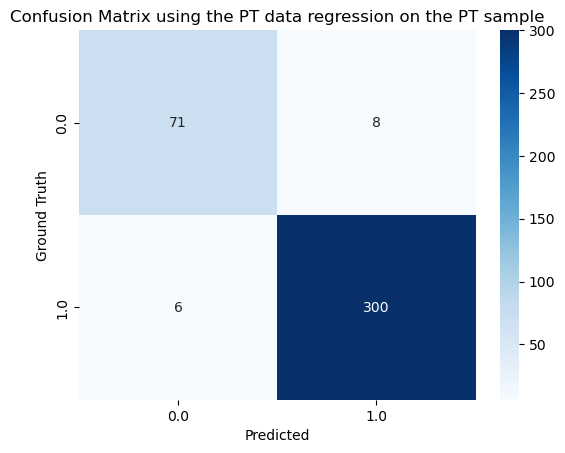

In [249]:
# Example ground truth and predicted labels
ground_truth = y_PT_test
predicted =pred_no_poly

# Create confusion matrix
cm = confusion_matrix(ground_truth, predicted)

# Create labels for the matrix
labels = np.unique(ground_truth)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix using the PT data regression on the PT sample')
plt.xlabel('Predicted')
plt.ylabel('Ground Truth')
plt.show()

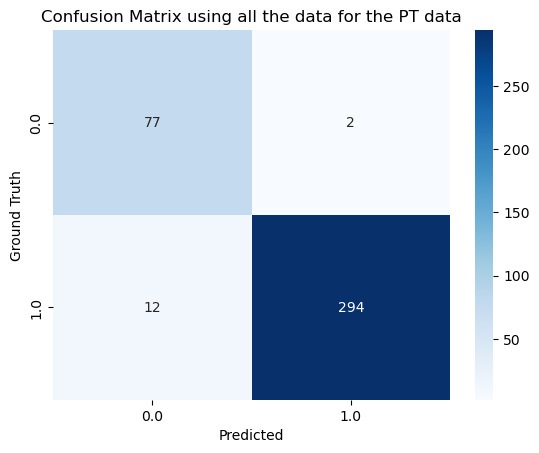

In [247]:
# Example ground truth and predicted labels
ground_truth = y_PT_test
predicted =pred_poly_ALL_on_PT

# Create confusion matrix
cm = confusion_matrix(ground_truth, predicted)

# Create labels for the matrix
labels = np.unique(ground_truth)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix using all the data for the PT data')
plt.xlabel('Predicted')
plt.ylabel('Ground Truth')
plt.show()

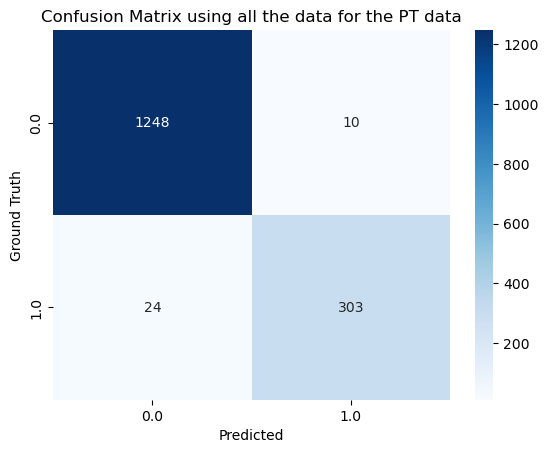

In [251]:
# Example ground truth and predicted labels

ground_truth = y_test
predicted =pred_copy

# Create confusion matrix
cm = confusion_matrix(ground_truth, predicted)

# Create labels for the matrix
labels = np.unique(ground_truth)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix using all the data for the PT data')
plt.xlabel('Predicted')
plt.ylabel('Ground Truth')
plt.show()

In [593]:
#scores
key = ["accuracy_no_poly","accuracy_poly","accuracy_no_poly_PT","accuracy_poly_PT","accuracy_no_poly_f","accuracy_poly_f","F1_data_no_poly","F1_data_poly","F1_PT_no_poly","F1_PT_poly"]
values = accuracy_no_poly,accuracy_poly,accuracy_no_poly_PT,accuracy_poly_PT,accuracy_no_poly_f,accuracy_poly_f,F1_data_no_poly,F1_data_poly,F1_PT_no_poly,F1_PT_poly
new_dict = {key: values for key, values in zip(key, values)}
print(new_dict)


{'accuracy_no_poly': 0.9690851735015773, 'accuracy_poly': 0.9810725552050473, 'accuracy_no_poly_PT': 0.9636363636363636, 'accuracy_poly_PT': 0.948051948051948, 'accuracy_no_poly_f': 0.993125, 'accuracy_poly_f': 0.9979166666666667, 'F1_data_no_poly': 0.9228346456692914, 'F1_data_poly': 0.9528301886792453, 'F1_PT_no_poly': 0.977198697068404, 'F1_PT_poly': 0.9673202614379085}


C:\Users\nati.TRANSALGAE\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Text(0, 0.5, 'recall')

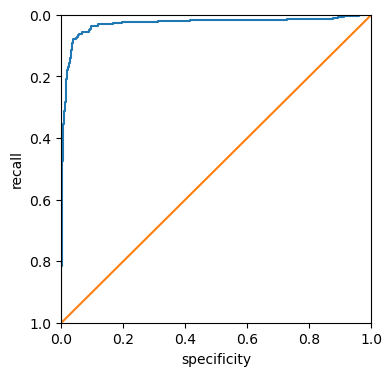

In [580]:
from sklearn.metrics import roc_curve

# display = PrecisionRecallDisplay.from_predictions
# (
#      pipeline_poly.predict(X_test), y_test
# )
# display
log_it = LogisticRegression(penalty = 'l2',C = 150 ,solver='lbfgs', random_state=42)
log_it.fit(X_test,y_test)
fpr,tpr,thresholds = roc_curve(np.array(y_test.astype(int)),log_it.predict_proba(X_test)[:,0])#,pos_label = 'default')
roc_df = pd.DataFrame({'recall' : tpr,'specificity' : 1 - fpr})

ax = roc_df.plot(x = 'specificity' , y = 'recall',figsize = (4,4),legend = False)
ax.set_ylim(1,0)
ax.set_xlim(0,1)
ax.plot((1,0),(0,1))
ax.set_xlabel('specificity')
ax.set_ylabel('recall')

In [581]:
print(f"Test accuracy without NO_PolynomialFeatures: {accuracy_no_poly:.3f}")
print(f"Test accuracy with PolynomialFeatures: {accuracy_poly:.3f}")
print(f"Test accuracy with PolynomialFeatures False data: {accuracy_poly_f:.3f}")
print(f"Test accuracy without NO_PolynomialFeatures: {accuracy_no_poly_f:.3f}")

Test accuracy without NO_PolynomialFeatures: 0.604
Test accuracy with PolynomialFeatures: 0.756
Test accuracy with PolynomialFeatures False data: 0.672
Test accuracy without NO_PolynomialFeatures: 0.472


In [582]:
tp, fp, fn, tn = confusion_matrix(y_test, pred_poly).ravel()
print(tn,fp,fn,tp)

321 381 6 877


In [583]:
from sklearn.metrics import roc_auc_score
clf = LogisticRegression(solver="liblinear",C = 0.1, random_state=0).fit(X_train, y_train)
roc_auc_score(y_train, clf.predict_proba(X_train)[:, 1])

0.9637731267614579

In [584]:
# for PT data
log_it = LogisticRegression(solver='lbfgs',C= 0.1, max_iter = 10000, random_state=42)
std_scaler = StandardScaler()
std_scaler.fit(data_x_PT)
data_std_scaled = std_scaler.transform(data_x_PT)
data_x_PT,data_y_PT = x_PT, y_PT = data_std_scaled[data_PT.columns[:-2]], data_PT["algae_bool"]
X_PT_train, X_PT_test, y_PT_train, y_PT_test = train_test_split(x_PT,y_PT, test_size=0.2, random_state=42)
log_it.fit(X_PT_train,y_PT_train)
pred_log_it = log_it.predict(X_PT_test)
tn_PT, fp_PT, fn_PT, tp_PT = confusion_matrix(y_PT_test, pred_log_it).ravel()
print(tn_PT,fp_PT,fn_PT,tp_PT)

71 8 6 300


In [585]:
accuracy_PT = (tn_PT+tp_PT)/(tn_PT+fp_PT+fn_PT+tp_PT)
accuracy_PT

0.9636363636363636

In [586]:
sklearn.metrics.f1_score(y_PT_test,pred_log_it)

0.977198697068404

In [587]:
# for ALL data
log_it = LogisticRegression(solver='lbfgs',C= 0.1, max_iter = 10000, random_state=42)
std_scaler = StandardScaler()
std_scaler.fit(data_x_PT)
data_std_scaled = std_scaler.transform(data_x)
log_it.fit(X_train,y_train)
pred_log_it = log_it.predict(X_test)
tn_PT, fp_PT, fn_PT, tp_PT = confusion_matrix(y_test, pred_log_it).ravel()
print(tn_PT,fp_PT,fn_PT,tp_PT)

1242 16 35 292


In [588]:
accuracy_PT = (tn_PT+tp_PT)/(tn_PT+fp_PT+fn_PT+tp_PT)
accuracy_PT

0.9678233438485805

In [589]:
sklearn.metrics.f1_score(y_test,pred_log_it)

0.9196850393700787

In [590]:
weights = log_it.coef_[0]
col = data_x.columns.tolist()
dic = dict(zip(col,weights))
results = pd.DataFrame.from_dict(dic, orient='index', columns=['Weight'])
results_sorted = results.sort_values(by='Weight', ascending=True)
results_sorted

,Weight
Area (ABD),-0.320318
Area (Filled),-0.270362
Width,-0.269302
Geodesic Thickness,-0.184805
Average Blue,-0.083049
Image Height,-0.075847
Diameter (ABD),-0.065590
Diameter (FD),-0.064131
Geodesic Aspect Ratio,-0.055433
Perimeter,-0.051819


In [591]:
# next step is to bring a diatom and insert into the machine
# or find another type of contaminant and check it vs the filter and the ML methods. 
# understand how to measure overfiting in differant models
# intrudoce loss error functions!

## random forest

In [595]:
pipeline_poly.poly__degree = 5

from sklearn.ensemble import RandomForestClassifier
# Pipeline with PolynomialFeatures
pipeline_poly = Pipeline(steps=[
    ('polynomial_expension', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
    ('dimension_reduction', PCA()),
    ('classifier', LogisticRegression(solver=['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'], random_state=42))
])

In [596]:
param_grid = [
    {
        'dimension_reduction': ['passthrough'],
        'classifier__penalty': ['l1', 'l2'],
        'classifier__C': [0.01, 0.1, 1, 10, 100],
        'classifier__solver': ['liblinear',]
    },
    {
        'dimension_reduction': ['passthrough'],
        'classifier': [RandomForestClassifier(random_state=42)],
        'classifier__n_estimators': [10, 20, 40, 80, 160,500],
        'classifier__max_depth': [2, 4, 8, 16, 32 , 64 , 128],        
    }
    
]

In [597]:
grid_search = GridSearchCV(pipeline_poly, param_grid, scoring='accuracy', cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 52 candidates, totalling 260 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('polynomial_expension',
                                        PolynomialFeatures()),
                                       ('scaler', StandardScaler()),
                                       ('dimension_reduction', PCA()),
                                       ('classifier',
                                        LogisticRegression(random_state=42,
                                                           solver=['lbfgs',
                                                                   'liblinear',
                                                                   'newton-cg',
                                                                   'newton-cholesky',
                                                                   'sag',
                                                                   'saga']))]),
             n_jobs=-1,
             param_grid=[{'classifier__C': [0.01, 0.1, 1, 10, 100],
                          'classifier__penalty': ['l1', 'l2'],
                          'classifier__solver': ['liblinear'],
                          'dimension_reduction': ['passthrough']},
                         {'classifier': [RandomForestClassifier(random_state=42)],
                          'classifier__max_depth': [2, 4, 8, 16, 32, 64, 128],
                          'classifier__n_estimators': [10, 20, 40, 80, 160,
                                                       500],
                          'dimension_reduction': ['passthrough']}],
             scoring='accuracy', verbose=2)

In [598]:
#cv_results_df.columns.tolist()

In [599]:
cols = ['param_classifier','param_classifier__penalty','param_classifier__C', 'param_classifier__n_estimators', 'param_classifier__max_depth', 'mean_test_score', 'param_dimension_reduction']

cv_results_df = pd.DataFrame(grid_search.cv_results_)
cv_results_df.sort_values(by = 'mean_test_score', ascending=False)[cols].head(10)

,param_classifier,param_classifier__penalty,param_classifier__C,param_classifier__n_estimators,param_classifier__max_depth,mean_test_score,param_dimension_reduction
3,NaN,l2,0.1,NaN,NaN,0.977434,passthrough
4,NaN,l1,1,NaN,NaN,0.976172,passthrough
2,NaN,l1,0.1,NaN,NaN,0.976014,passthrough
33,RandomForestClassifier(random_state=42),NaN,NaN,500,16,0.975698,passthrough
48,RandomForestClassifier(random_state=42),NaN,NaN,40,128,0.975540,passthrough
42,RandomForestClassifier(random_state=42),NaN,NaN,40,64,0.975540,passthrough
36,RandomForestClassifier(random_state=42),NaN,NaN,40,32,0.975540,passthrough
5,NaN,l2,1,NaN,NaN,0.975383,passthrough
45,RandomForestClassifier(random_state=42),NaN,NaN,500,64,0.975382,passthrough
30,RandomForestClassifier(random_state=42),NaN,NaN,40,16,0.975382,passthrough


In [182]:
pipeline_poly = Pipeline(steps=[
    ('polynomial_expension', PolynomialFeatures(degree=2)),
#    ('scaler', StandardScaler()),
    ('dimension_reduction', PCA()),
    ('classifier', RandomForestClassifier(n_estimators=500,max_depth = 16, random_state=42))
])

pipeline_no_poly = Pipeline(steps=[
#    ('scaler', StandardScaler()),
    ('dimension_reduction', PCA()),
    ('classifier', RandomForestClassifier(n_estimators=500,max_depth = 16, random_state=42))
])



#fit pipline to the merged data
pipeline_no_poly_data = pipeline_no_poly.fit(X_train, y_train)
pipeline_poly_data = pipeline_poly.fit(X_train, y_train)

# Evaluate the pipelines on the test data
accuracy_no_poly = pipeline_no_poly_data.score(X_test, y_test)
accuracy_poly = pipeline_poly_data.score(X_test, y_test)

# Evaluate the pipelines on the false data
accuracy_no_poly_f = pipeline_no_poly.score(X_F_train,y_F_train)
accuracy_poly_f = pipeline_poly.score(X_F_train, y_F_train)

# predict the results by the model for the merged data
pred_no_poly = pipeline_no_poly.predict(X_test)
pred_poly = pipeline_poly.predict(X_test)
pred_poly_PT = pipeline_no_poly.predict(X_PT_test)
#F1 scores
F1_data_no_poly = sklearn.metrics.f1_score(y_test, pred_no_poly)
F1_data_poly = sklearn.metrics.f1_score(y_test, pred_poly)

#fit the piplines to the pt data
pipeline_no_poly_PT = pipeline_no_poly.fit(X_PT_train, y_PT_train)
pipeline_poly_PT =pipeline_poly.fit(X_PT_train, y_PT_train)

# Evaluate the pipelines on the test data
accuracy_no_poly_PT = pipeline_no_poly_PT.score(X_PT_test, y_PT_test)
accuracy_poly_PT = pipeline_poly_PT.score(X_PT_test, y_PT_test)

# predict the results by the model for the merged data
pred_no_poly = pipeline_no_poly_PT.predict(X_PT_test)
pred_poly = pipeline_poly_PT.predict(X_PT_test)

#F1 scores
F1_PT_no_poly = sklearn.metrics.f1_score(y_PT_test, pred_no_poly)
F1_PT_poly = sklearn.metrics.f1_score(y_PT_test, pred_poly)


# pipeline_poly.fit(X_train, y_train)
# pipeline_no_poly.fit(X_train, y_train)

# pipeline_no_poly_PT = pipeline_no_poly.fit(X_PT_train, y_PT_train)
# pipeline_poly_PT =pipeline_poly.fit(X_PT_train, y_PT_train)

# accuracy_no_poly = pipeline_no_poly.score(X_test, y_test)
# accuracy_poly = pipeline_poly.score(X_test, y_test)

# accuracy_no_poly_PT = pipeline_no_poly_PT.score(X_PT_test, y_PT_test)
# accuracy_poly_PT = pipeline_poly_PT.score(X_PT_test, y_PT_test)

# # for false data
# accuracy_no_poly_f = pipeline_no_poly.score(X_F_train,y_F_train)
# accuracy_poly_f = pipeline_poly.score(X_F_train,y_F_train)
# print(f"Test accuracy with noPolynomialFeatures: {accuracy_no_poly:.3f}")
# print(f"Test accuracy with PolynomialFeatures: {accuracy_poly:.3f}")
# print(f"Test accuracy with PolynomialFeatures false data: {accuracy_poly_f:.3f}")

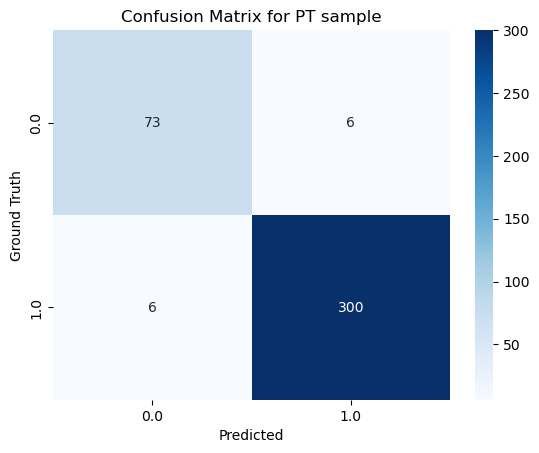

In [183]:
# Example ground truth and predicted labels
ground_truth = y_PT_test
predicted =pred_no_poly

# Create confusion matrix
cm = confusion_matrix(ground_truth, predicted)

# Create labels for the matrix
labels = np.unique(ground_truth)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix for PT sample')
plt.xlabel('Predicted')
plt.ylabel('Ground Truth')
plt.show()

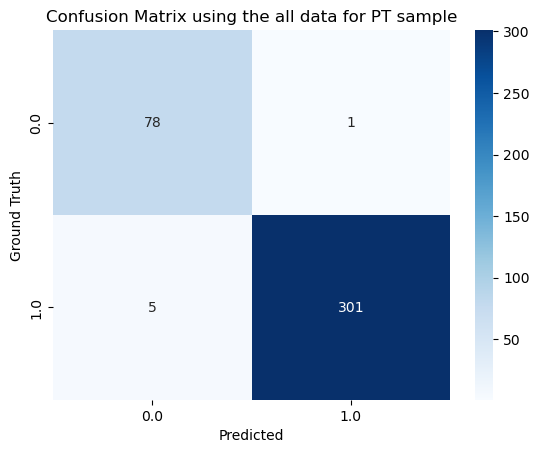

In [184]:
# Example ground truth and predicted labels
ground_truth = y_PT_test
predicted =pred_poly_PT

# Create confusion matrix
cm = confusion_matrix(ground_truth, predicted)

# Create labels for the matrix
labels = np.unique(ground_truth)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix using the all data for PT sample')
plt.xlabel('Predicted')
plt.ylabel('Ground Truth')
plt.show()

In [601]:
#scores
key = ["accuracy_no_poly","accuracy_poly","accuracy_no_poly_PT","accuracy_poly_PT","accuracy_no_poly_f","accuracy_poly_f","F1_data_no_poly","F1_data_poly","F1_PT_no_poly","F1_PT_poly"]
values = accuracy_no_poly,accuracy_poly,accuracy_no_poly_PT,accuracy_poly_PT,accuracy_no_poly_f,accuracy_poly_f,F1_data_no_poly,F1_data_poly,F1_PT_no_poly,F1_PT_poly
new_dict = {key: values for key, values in zip(key, values)}
print(new_dict)

{'accuracy_no_poly': 0.97602523659306, 'accuracy_poly': 0.9583596214511041, 'accuracy_no_poly_PT': 0.9688311688311688, 'accuracy_poly_PT': 0.8753246753246753, 'accuracy_no_poly_f': 0.99875, 'accuracy_poly_f': 0.9983333333333333, 'F1_data_no_poly': 0.9404388714733544, 'F1_data_poly': 0.8932038834951457, 'F1_PT_no_poly': 0.9803921568627451, 'F1_PT_poly': 0.9175257731958762}


In [602]:
#only PT
from sklearn.ensemble import RandomForestClassifier
model1 = RandomForestClassifier(n_estimators=500,max_depth = 16, random_state = 42) 
data_x_PT,data_y_PT = x_PT, y_PT = data_PT[data_PT.columns[:-2]], data_PT["algae_bool"]
X_PT_train, X_PT_test, y_PT_train, y_PT_test = train_test_split(x_PT,y_PT, test_size=0.2, random_state=42)
model1.fit(X_PT_train, y_PT_train) 
pred = model1.predict(X_PT_test)
myClassifiers = pd.Series(model1.feature_importances_, index=X_train.columns)
myClassifiers = myClassifiers.sort_values(ascending=False)
print (myClassifiers.head(15))

Length                     0.113760
Volume (ESD)               0.090543
Diameter (ESD)             0.087873
Convex Perimeter           0.078487
Perimeter                  0.064780
Geodesic Length            0.051549
Area (Filled)              0.039110
Area (ABD)                 0.037128
Biovolume (Sphere)         0.032381
Diameter (FD)              0.031756
Volume (ABD)               0.030266
Diameter (ABD)             0.030245
Circle Fit                 0.029178
Biovolume (P. Spheroid)    0.018916
Sum Intensity              0.018772
dtype: float64


In [603]:
model1.score(X_PT_test, y_PT_test)


0.9662337662337662

In [604]:
sklearn.metrics.f1_score(y_PT_test,pred)


0.9787234042553192

In [605]:
from sklearn.ensemble import RandomForestClassifier
model2 = RandomForestClassifier(n_estimators=500,max_depth = 16, random_state = 42)
data_x,data_y = x, y = data[data.columns[:-2]], data["algae_bool"]
X_train, X_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=42)
model2.fit(X_train, y_train) 
pred = model2.predict(X_test)
myClassifiers = pd.Series(model2.feature_importances_, index=X_train.columns)
myClassifiers = myClassifiers.sort_values(ascending=False)
print (myClassifiers.head(15))

Circle Fit               0.109981
Aspect Ratio             0.104779
Geodesic Length          0.060550
Circularity (Hu)         0.057673
Length                   0.054501
Compactness              0.048599
Circularity              0.046169
Average Red              0.036759
Geodesic Aspect Ratio    0.034376
Average Green            0.032598
Elongation               0.028873
Transparency             0.027921
Intensity                0.023708
Convex Perimeter         0.022581
Perimeter                0.021910
dtype: float64


In [606]:
model2.score(X_test, y_test)

0.9684542586750788

In [607]:
sklearn.metrics.f1_score(y_test,pred)

0.9221183800623053

In [608]:
List_of_most_sig = ["Circle Fit","Circularity (Hu)","Geodesic Aspect Ratio","Circularity","Elongation","Length","Convex Perimeter","Compactness","Transparency","Average Red","Aspect Ratio","Intensity"]
model2 = RandomForestClassifier(n_estimators=500,max_depth = 16,random_state = 42) 
model2.fit(X_train[List_of_most_sig], y_train) 

RandomForestClassifier(max_depth=16, n_estimators=500, random_state=42)

In [609]:
model2.score(X_test[List_of_most_sig], y_test)

0.9665615141955836

# SVM

In [133]:


from sklearn import svm
# Pipeline with PolynomialFeatures
pipeline_poly = Pipeline(steps=[
    ('polynomial_expension', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
    ('dimension_reduction', PCA()),
    ('classifier', svm.SVC())
])
pipeline_poly.poly__degree = 2

pipeline_no_poly = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('dimension_reduction', PCA()),
    ('classifier', svm.SVC())
])

In [29]:
param_grid = [
    {'classifier__C':[0.001,0.1,10,100],
     'classifier__degree':[1,10,100],
     'classifier__kernel': ['linear']} ]

In [30]:
grid_search = GridSearchCV(pipeline_poly, param_grid, scoring='accuracy',refit = True, cv=5, n_jobs=-1, verbose=2,error_score='raise')
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=5, error_score='raise',
             estimator=Pipeline(steps=[('polynomial_expension',
                                        PolynomialFeatures()),
                                       ('scaler', StandardScaler()),
                                       ('dimension_reduction', PCA()),
                                       ('classifier', SVC())]),
             n_jobs=-1,
             param_grid=[{'classifier__C': [0.001, 0.1, 10, 100],
                          'classifier__degree': [1, 10, 100],
                          'classifier__kernel': ['linear']}],
             scoring='accuracy', verbose=2)

In [31]:
cols = ['param_classifier__degree','param_classifier__C','param_classifier__kernel', 'mean_test_score']

cv_results_df = pd.DataFrame(grid_search.cv_results_)
cv_results_df.sort_values(by = 'mean_test_score', ascending=False)[cols].head(10)

,param_classifier__degree,param_classifier__C,param_classifier__kernel,mean_test_score
3,1,0.1,linear,0.977276
4,10,0.1,linear,0.977276
5,100,0.1,linear,0.977276
0,1,0.001,linear,0.976172
1,10,0.001,linear,0.976172
2,100,0.001,linear,0.976172
6,1,10,linear,0.973805
7,10,10,linear,0.973805
8,100,10,linear,0.973805
9,1,100,linear,0.970017


In [102]:
# Fit the pipelines to the training data

pipeline_no_poly.fit(X_train, y_train)
pipeline_poly.fit(X_train, y_train)

Pipeline(steps=[('polynomial_expension', PolynomialFeatures()),
                ('dimension_reduction', PCA()),
                ('classifier',
                 RandomForestClassifier(max_depth=16, n_estimators=500,
                                        random_state=42))])

In [103]:
# Evaluate the pipelines on the test data
accuracy_no_poly = pipeline_no_poly.score(X_test, y_test)
accuracy_poly = pipeline_poly.score(X_test, y_test)
accuracy_poly_f = pipeline_poly.score(X_F_test, y_F_test)

In [104]:
print(f"Test accuracy without noPolynomialFeatures: {accuracy_no_poly:.3f}")
print(f"Test accuracy with PolynomialFeatures: {accuracy_poly:.3f}")
print(f"Test accuracy False with PolynomialFeatures: {accuracy_poly_f:.3f}")

Test accuracy without noPolynomialFeatures: 0.976
Test accuracy with PolynomialFeatures: 0.958
Test accuracy False with PolynomialFeatures: 0.997


In [134]:
import sklearn
from sklearn.metrics import f1_score
pipeline_poly.C = 0.1
pipeline_poly.degree = 100
pipeline_poly.kernel = "linear"

pipeline_no_poly.param_classifier__C = 0.1
pipeline_no_poly.param_classifier__penalty = 100
pipeline_no_poly.param_dimension_reduction = "linear"



#fit pipline to the merged data
pipeline_no_poly_data = pipeline_no_poly.fit(X_train, y_train)
pipeline_poly_data = pipeline_poly.fit(X_train, y_train)

# Evaluate the pipelines on the test data
accuracy_no_poly = pipeline_no_poly_data.score(X_test, y_test)
accuracy_poly = pipeline_poly_data.score(X_test, y_test)

# Evaluate the pipelines on the false data
accuracy_no_poly_f = pipeline_no_poly.score(X_F_train,y_F_train)
accuracy_poly_f = pipeline_poly.score(X_F_train, y_F_train)

# predict the results by the model for the merged data
pred_no_poly = pipeline_no_poly.predict(X_test)
pred_poly = pipeline_poly.predict(X_test)
pred_poly_PT = pipeline_no_poly.predict(X_PT_test)
#F1 scores
F1_data_no_poly = sklearn.metrics.f1_score(y_test, pred_no_poly)
F1_data_poly = sklearn.metrics.f1_score(y_test, pred_poly)

#fit the piplines to the pt data
pipeline_no_poly_PT = pipeline_no_poly.fit(X_PT_train, y_PT_train)
pipeline_poly_PT =pipeline_poly.fit(X_PT_train, y_PT_train)

# Evaluate the pipelines on the test data
accuracy_no_poly_PT = pipeline_no_poly_PT.score(X_PT_test, y_PT_test)
accuracy_poly_PT = pipeline_poly_PT.score(X_PT_test, y_PT_test)

# predict the results by the model for the merged data
pred_no_poly = pipeline_no_poly_PT.predict(X_PT_test)
pred_poly = pipeline_poly_PT.predict(X_PT_test)

#F1 scores
F1_PT_no_poly = sklearn.metrics.f1_score(y_PT_test, pred_no_poly)
F1_PT_poly = sklearn.metrics.f1_score(y_PT_test, pred_poly)



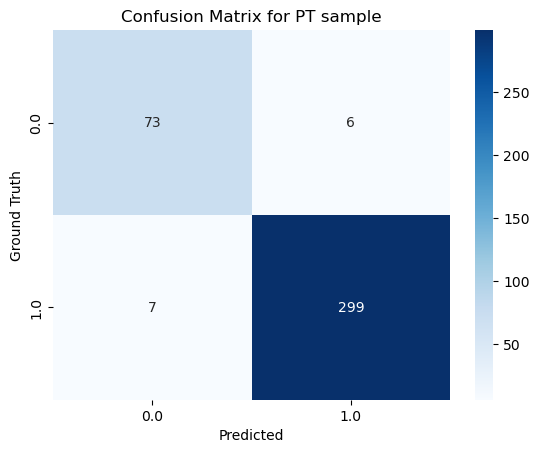

In [135]:
# Example ground truth and predicted labels
ground_truth = y_PT_test
predicted =pred_no_poly

# Create confusion matrix
cm = confusion_matrix(ground_truth, predicted)

# Create labels for the matrix
labels = np.unique(ground_truth)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix for PT sample')
plt.xlabel('Predicted')
plt.ylabel('Ground Truth')
plt.show()

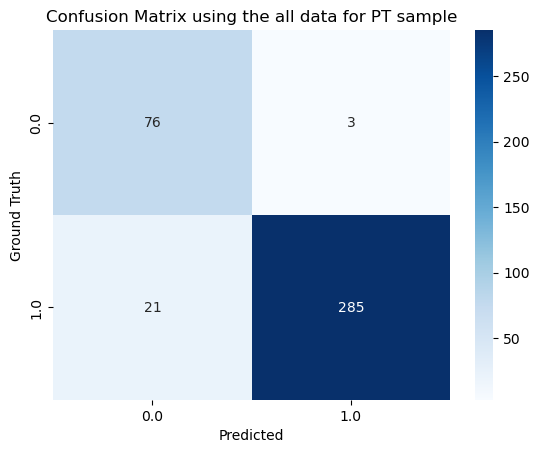

In [137]:
# Example ground truth and predicted labels
ground_truth = y_PT_test
predicted =pred_poly_PT

# Create confusion matrix
cm = confusion_matrix(ground_truth, predicted)

# Create labels for the matrix
labels = np.unique(ground_truth)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix using the all data for PT sample')
plt.xlabel('Predicted')
plt.ylabel('Ground Truth')
plt.show()

In [43]:
#scores
key = ["accuracy_no_poly","accuracy_poly","accuracy_no_poly_PT","accuracy_poly_PT","accuracy_no_poly_f","accuracy_poly_f","F1_data_no_poly","F1_data_poly","F1_PT_no_poly","F1_PT_poly"]
values = accuracy_no_poly,accuracy_poly,accuracy_no_poly_PT,accuracy_poly_PT,accuracy_no_poly_f,accuracy_poly_f,F1_data_no_poly,F1_data_poly,F1_PT_no_poly,F1_PT_poly
new_dict = {key: values for key, values in zip(key, values)}
print(new_dict)

{'accuracy_no_poly': 0.9772870662460568, 'accuracy_poly': 0.9772870662460568, 'accuracy_no_poly_PT': 0.9662337662337662, 'accuracy_poly_PT': 0.9662337662337662, 'accuracy_no_poly_f': 0.9966666666666667, 'accuracy_poly_f': 0.995625, 'F1_data_no_poly': 0.943217665615142, 'F1_data_poly': 0.9433962264150944, 'F1_PT_no_poly': 0.9787234042553192, 'F1_PT_poly': 0.9787234042553192}


# KNN

In [44]:
from sklearn.neighbors  import KNeighborsClassifier
# Pipeline with PolynomialFeatures
pipeline_poly = Pipeline(steps=[
    ('polynomial_expension', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
    ('dimension_reduction', PCA()),
    ('classifier', KNeighborsClassifier())
])

In [45]:
param_grid = [
    {'classifier__n_neighbors': [3,5,7,9,15],
     
    } ]

In [46]:
grid_search = GridSearchCV(pipeline_poly, param_grid, scoring='accuracy',refit = True, cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('polynomial_expension',
                                        PolynomialFeatures()),
                                       ('scaler', StandardScaler()),
                                       ('dimension_reduction', PCA()),
                                       ('classifier', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid=[{'classifier__n_neighbors': [3, 5, 7, 9, 15]}],
             scoring='accuracy', verbose=2)

In [47]:
cols = ['param_classifier__n_neighbors','mean_test_score']

cv_results_df = pd.DataFrame(grid_search.cv_results_)
cv_results_df.sort_values(by = 'mean_test_score', ascending=False)[cols].head(10)

,param_classifier__n_neighbors,mean_test_score
1,5,0.970964
3,9,0.970018
4,15,0.970017
2,7,0.968756
0,3,0.968440


In [107]:
#insert the right hyperparameters
pipeline_poly.n_neighbors = 5



#fit pipline to the merged data
# pipeline_no_poly_data = pipeline_no_poly.fit(X_train, y_train)
pipeline_poly_data = pipeline_poly.fit(X_train, y_train)

# Evaluate the pipelines on the test data
# accuracy_no_poly = pipeline_no_poly_data.score(X_test, y_test)
accuracy_poly = pipeline_poly_data.score(X_test, y_test)

# Evaluate the pipelines on the false data
# accuracy_no_poly_f = pipeline_no_poly.score(X_F_train,y_F_train)
accuracy_poly_f = pipeline_poly.score(X_F_train, y_F_train)

# predict the results by the model for the merged data
# pred_no_poly = pipeline_no_poly.predict(X_test)
pred_poly = pipeline_poly.predict(X_test)

#F1 scores
# F1_data_no_poly = sklearn.metrics.f1_score(y_test, pred_no_poly)
F1_data_poly = sklearn.metrics.f1_score(y_test, pred_poly)

#fit the piplines to the pt data
# pipeline_no_poly_PT = pipeline_no_poly.fit(X_PT_train, y_PT_train)
pipeline_poly_PT =pipeline_poly.fit(X_PT_train, y_PT_train)

# Evaluate the pipelines on the test data
# accuracy_no_poly_PT = pipeline_no_poly_PT.score(X_PT_test, y_PT_test)
accuracy_poly_PT = pipeline_poly_PT.score(X_PT_test, y_PT_test)

# predict the results by the model for the merged data
# pred_no_poly = pipeline_no_poly_PT.predict(X_PT_test)
pred_poly = pipeline_poly_PT.predict(X_PT_test)

#F1 scores
# F1_PT_no_poly = sklearn.metrics.f1_score(y_PT_test, pred_no_poly)
F1_PT_poly = sklearn.metrics.f1_score(y_PT_test, pred_poly)


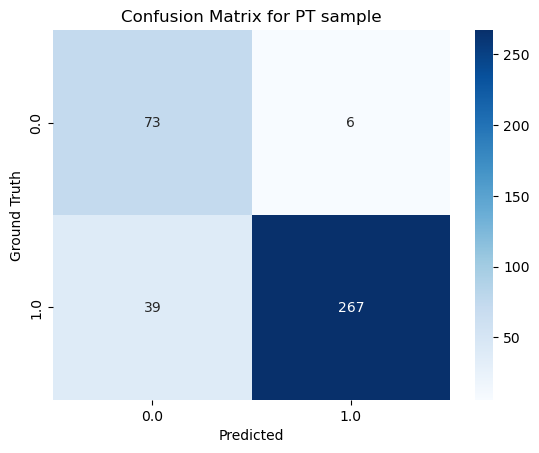

In [109]:
# Example ground truth and predicted labels
ground_truth = y_PT_test
predicted =pred_poly

# Create confusion matrix
cm = confusion_matrix(ground_truth, predicted)

# Create labels for the matrix
labels = np.unique(ground_truth)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix for PT sample')
plt.xlabel('Predicted')
plt.ylabel('Ground Truth')
plt.show()

In [49]:
#scores
key = ["accuracy_no_poly","accuracy_poly","accuracy_no_poly_PT","accuracy_poly_PT","accuracy_no_poly_f","accuracy_poly_f","F1_data_no_poly","F1_data_poly","F1_PT_no_poly","F1_PT_poly"]
values = accuracy_no_poly,accuracy_poly,accuracy_no_poly_PT,accuracy_poly_PT,accuracy_no_poly_f,accuracy_poly_f,F1_data_no_poly,F1_data_poly,F1_PT_no_poly,F1_PT_poly
new_dict = {key: values for key, values in zip(key, values)}
print(new_dict)

{'accuracy_no_poly': 0.9772870662460568, 'accuracy_poly': 0.9640378548895899, 'accuracy_no_poly_PT': 0.9662337662337662, 'accuracy_poly_PT': 0.9636363636363636, 'accuracy_no_poly_f': 0.9966666666666667, 'accuracy_poly_f': 0.9910416666666667, 'F1_data_no_poly': 0.943217665615142, 'F1_data_poly': 0.9107981220657276, 'F1_PT_no_poly': 0.9787234042553192, 'F1_PT_poly': 0.977198697068404}


# intrudocing dummy variables

In [50]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Define categorical and numerical features
categorical_features = ['Particles Per Chain']
numerical_features =['Area (ABD)', 'Area (Filled)', 'Aspect Ratio', 'Average Blue',
       'Average Green', 'Average Red', 'Biovolume (Cylinder)',
       'Biovolume (P. Spheroid)', 'Biovolume (Sphere)', 'Circle Fit',
       'Circularity', 'Circularity (Hu)', 'Compactness', 'Convex Perimeter',
       'Convexity', 'Diameter (ABD)', 'Diameter (ESD)', 'Diameter (FD)',
       'Edge Gradient', 'Elongation', 'Fiber Curl', 'Fiber Straightness',
        'Geodesic Aspect Ratio', 'Geodesic Length',
       'Geodesic Thickness', 'Image Height', 'Image Width', 'Intensity',
       'Length', 'Perimeter', 'Ratio Blue/Green',
       'Ratio Red/Blue', 'Ratio Red/Green', 'Roughness', 'Sigma Intensity',
       'Sum Intensity', 'Symmetry', 'Transparency', 'Volume (ABD)',
       'Volume (ESD)', 'Width']

# Create categorical and numerical transformers
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value= None)),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

# Combine transformers using ColumnTransformer
PT_preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
], remainder='drop')

In [51]:
PT_preprocessor

ColumnTransformer(transformers=[('num',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('scaler', StandardScaler())]),
                                 ['Area (ABD)', 'Area (Filled)', 'Aspect Ratio',
                                  'Average Blue', 'Average Green',
                                  'Average Red', 'Biovolume (Cylinder)',
                                  'Biovolume (P. Spheroid)',
                                  'Biovolume (Sphere)', 'Circle Fit',
                                  'Circularity', 'Circularity (Hu)',
                                  'Compactness', 'Convex Perim...
                                  'Edge Gradient', 'Elongation', 'Fiber Curl',
                                  'Fiber Straightness', 'Geodesic Aspect Ratio',
                                  'Geodesic Length', 'Geodesic Thickness',
                                  'Image Height', 'Image Width', 'Intensity',
                                  'Length', 'Perimeter', ...]),
                                ('cat',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='constant')),
                                                 ('onehot',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False))]),
                                 ['Particles Per Chain'])])

In [54]:
from sklearn import set_config
set_config(transform_output='pandas')
PT_preprocessor.fit_transform(x).head()

,num__Area (ABD),num__Area (Filled),num__Aspect Ratio,num__Average Blue,num__Average Green,num__Average Red,num__Biovolume (Cylinder),num__Biovolume (P. Spheroid),num__Biovolume (Sphere),num__Circle Fit,...,num__Sigma Intensity,num__Sum Intensity,num__Symmetry,num__Transparency,num__Volume (ABD),num__Volume (ESD),num__Width,cat__Particles Per Chain_1,cat__Particles Per Chain_2,cat__Particles Per Chain_3
0,0.596288,0.595833,-1.502143,0.964883,0.712564,0.556696,0.281348,0.013729,0.191628,-1.550650,...,0.445763,0.901961,0.697885,0.659130,0.191402,0.202873,0.107264,1.0,0.0,0.0
1,0.626777,0.626304,-1.197755,0.720937,0.855165,0.935205,0.121331,0.093322,0.208964,-1.368124,...,-1.391418,0.944860,-1.454154,0.999835,0.209219,0.295028,0.736877,1.0,0.0,0.0
2,0.918548,0.917904,-2.240925,0.293619,1.010882,1.135641,-0.006691,0.810315,0.384949,-2.482675,...,-0.594051,1.294182,-1.446834,4.119538,0.385412,4.382133,1.051683,0.0,0.0,1.0
3,0.544565,0.544140,-1.836568,1.061944,0.704938,0.504294,0.059039,-0.035576,0.162696,-2.152607,...,0.339917,0.841867,-0.274530,1.786079,0.162696,0.465516,-0.102574,1.0,0.0,0.0
4,0.666482,0.665986,-1.637527,0.770170,0.315122,0.240070,0.304230,0.024884,0.231848,-1.817215,...,0.640807,0.930926,0.408469,0.898747,0.231986,0.295028,0.212200,1.0,0.0,0.0


In [55]:
# Create a full pipeline with a classifier
full_pipeline = Pipeline(steps=[
    ('preprocessor', PT_preprocessor),
    ('dimension_reduction', PCA()),
    ('classifier', LogisticRegression(solver='liblinear')),
    
    
    
])

# Fit the pipeline to the training data
full_pipeline.fit(X_train, y_train)

# Evaluate the pipeline on the test data
accuracy = full_pipeline.score(X_test, y_test)
print(f"Test accuracy: {accuracy:.3f}")


Test accuracy: 0.970


# Results

# model accuracy comparison

In [155]:
results = pd.DataFrame(columns = ["model", "accuracy","accuracy false data","F1 Score", "Hyper_param"])
results.loc[len(results.index)] = ["baseline_PT",0.908,0.188,0.94,""]
results.loc[len(results.index)] = ["baseline_ALL",0.363,0.188,0.362,""]
results.loc[len(results.index)] = ["Linear_reg_PT",0.963,0.977,0.977,"C= 0.1, max_iter = 10000"]
results.loc[len(results.index)] = ["Linear_reg_ALL",0.981,0.998,0.953,"C= 0.1, max_iter = 10000"]
results.loc[len(results.index)] = ["Random_forest_PT",0.969,0.95,0.98,"n_estimators=500,max_depth = 16"]
results.loc[len(results.index)] = ["Random_forest_ALL",0.976,0.998,0.94,"n_estimators=500,max_depth = 16"]
results.loc[len(results.index)] = ["Random_forest_ALL_on_PT_sample",0.984,0.999,0.99,"n_estimators=500,max_depth = 16"]
results.loc[len(results.index)] = ["SVM_PT",0.977,0.996,0.978,"degree = 100,C =0.1 kernel = linear"]
results.loc[len(results.index)] = ["SVM_ALL",0.977,0.996,0.94,"degree = 100,C =0.1 kernel = linear"]
results.loc[len(results.index)] = ["KNN_ALL",0.964,0.99,0.91,"5 K nighbours"]
results



,model,accuracy,accuracy false data,F1 Score,Hyper_param
0,baseline_PT,0.908,0.188,0.940,
1,baseline_ALL,0.363,0.188,0.362,
2,Linear_reg_PT,0.963,0.977,0.977,"C= 0.1, max_iter = 10000"
3,Linear_reg_ALL,0.981,0.998,0.953,"C= 0.1, max_iter = 10000"
4,Random_forest_PT,0.969,0.950,0.980,"n_estimators=500,max_depth = 16"
5,Random_forest_ALL,0.976,0.998,0.940,"n_estimators=500,max_depth = 16"
6,Random_forest_ALL_on_PT_sample,0.984,0.999,0.990,"n_estimators=500,max_depth = 16"
7,SVM_PT,0.977,0.996,0.978,"degree = 100,C =0.1 kernel = linear"
8,SVM_ALL,0.977,0.996,0.940,"degree = 100,C =0.1 kernel = linear"
9,KNN_ALL,0.964,0.990,0.910,5 K nighbours


# feature importance comparison

In [58]:
importance = pd.DataFrame()
baseline = ["Diameter (ESD)", "Elongation", "Fiber straightness", "Intensity", "Length", "Transperency", "Width"] 
linear_reg = ["Area (ABD)","Area (Filled)","Width","Geodesic Thickness","Length","Geodesic Length","Elongation"]
random_forest = ["Length","Volume (ESD)","Diameter (ESD)","Convex Perimeter","Perimeter","Geodesic Length","Area (Filled)"]
dic =  {"Baseline":baseline,"Linear_regression":linear_reg,"Random forest":random_forest}                
importance = pd.DataFrame(data = dic)
importance

,Baseline,Linear_regression,Random forest
0,Diameter (ESD),Area (ABD),Length
1,Elongation,Area (Filled),Volume (ESD)
2,Fiber straightness,Width,Diameter (ESD)
3,Intensity,Geodesic Thickness,Convex Perimeter
4,Length,Length,Perimeter
5,Transperency,Geodesic Length,Geodesic Length
6,Width,Elongation,Area (Filled)


# conclusion

In [59]:
# first show the overfit of the baseline
# second show the good fit of the other models
# third show accuracy of the models
# forth ways to implament the data
# fifth disscuse future opertiuneties like morphology detection and strange bodies detection
#

# Opertuinites of accurate data
<span style="font-size:20px;">1.Improved Understanding: Accurate measurements provide a more precise understanding of the growth dynamics and behavior of algae. By obtaining reliable data on parameters such as biomass concentration, growth rates, or nutrient uptake, researchers can gain deeper insights into the factors influencing algae growth. This knowledge can aid in optimizing cultivation conditions, identifying potential limitations, and developing effective strategies for enhanced productivity.</span>

<span style="font-size:20px;">2.Enhanced Process Control: Accurate measurements enable better process control in algae cultivation systems. By monitoring and accurately measuring key parameters, such as algae density, nutrient levels, pH, or light intensity, operators can adjust and optimize cultivation conditions in real-time. This allows for more precise nutrient dosing, light exposure, and other environmental factors, leading to improved growth and productivity of algae.</span>

<span style="font-size:20px;">3.Efficient Resource Management: Accurate measurements help optimize the utilization of resources such as nutrients, water, and energy. By accurately assessing the biomass concentration and growth rate, operators can determine the appropriate amount of nutrients required to support optimal growth without wastage. This reduces resource costs and minimizes environmental impact associated with excess nutrient usage.</span>

<span style="font-size:20px;">4.Reliable Predictions and Modeling: Accurate measurements serve as a foundation for reliable predictions and modeling in algae cultivation systems. Precise data enables the development of accurate growth models that can project future biomass concentrations, optimize harvesting schedules, and estimate yields. These predictive models allow for better planning and decision-making in commercial-scale algae production or research studies.</span>

<span style="font-size:20px;">5.Quality Control: Accurate measurements are crucial for quality control in algae-based products. Whether producing algae for food, biofuels, pharmaceuticals, or other applications, precise measurements of parameters such as lipid content, protein concentration, or pigment composition ensure consistent and high-quality output. This contributes to product standardization and compliance with industry regulations.</span>

<span style="font-size:20px;">6.Research Advancements: Accurate measurements facilitate scientific advancements in the field of algae research. Reliable data allows for meaningful comparisons between different experiments, protocols, or cultivation strategies. It also enables the reproducibility of results, promotes collaboration among researchers, and contributes to the accumulation of knowledge in the algae cultivation domain.</span>

<span style="font-size:20px;">In summary, greater accuracy in algae measurements brings numerous benefits, including improved understanding, enhanced process control, efficient resource management, reliable predictions, quality control, and advancements in research. These advantages collectively support the development and optimization of algae cultivation systems for various applications, ranging from sustainable food production to renewable energy and environmental remediation.</span>


# Future Projects
## Manual Classification of All Algae Species and Contaminants 
<span style="font-size:20px;">This project involves the manual classification of all algae species and contaminants present in the site. It is expected to take approximately two week to complete.</span>

## Morphology Classification of Each Species 

<span style="font-size:20px;">The objective of this project is to classify each species based on their morphology. It will involve analyzing the physical characteristics with relation to the algae health of each algae species, . The estimated time for completion is one month.</span>

## Implementation of Outdoor Visual Analysis Based on Accurate Measures from the Reactors.

<span style="font-size:20px;">In this project, accurate measurements obtained from the reactors will be utilized to implement an outdoor visual analysis system. This system will help monitor the health and growth of algae in outdoor environments.The estimated time for completion is six months.</span>

## Growth Monitor Modeling

<span style="font-size:20px;">The growth monitor modeling project aims to develop a model that can effectively monitor and predict the growth of algae. It will involve analyzing various factors such as nutrient levels, temperature, and light conditions to create a comprehensive growth monitoring system.
These future projects highlight different aspects of algae research and monitoring, ranging from manual classification to the development of modeling systems for growth monitoring.
The estimated time for completion is one year.</span>

<span style="font-size:30px;">Each project has an estimated timeline for completion, providing a clear outline of the expected time required for each task.</span>






# NN 

In [4]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [5]:
model = Sequential()
model.add(Dense(64, input_dim=42, activation='relu'))
model.add(Dropout(rate=0.2))
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='softmax'))
model.add(Dense(4, activation='tanh'))
model.add(Dense(1, activation='sigmoid'))

optimizer = Adam(learning_rate=0.3)
model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [76]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_27 (Dense)            (None, 100)               4300      
                                                                 
 dropout_7 (Dropout)         (None, 100)               0         
                                                                 
 dense_28 (Dense)            (None, 50)                5050      
                                                                 
 dense_29 (Dense)            (None, 25)                1275      
                                                                 
 dense_30 (Dense)            (None, 12)                312       
                                                                 
 dense_31 (Dense)            (None, 1)                 13        
                                                                 
Total params: 10,950
Trainable params: 10,950
Non-trai

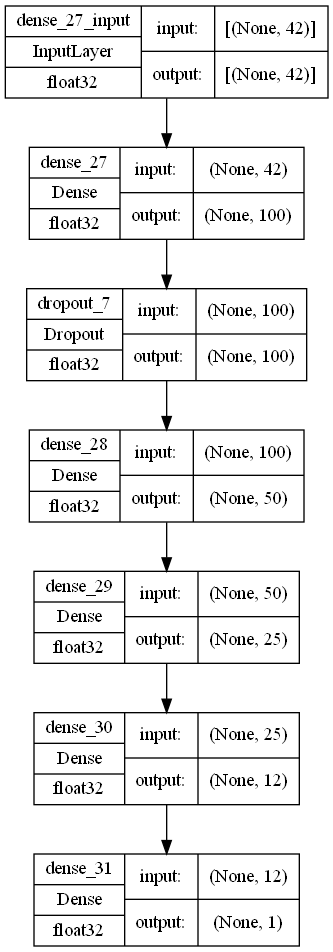

In [77]:
tf.keras.utils.plot_model(model, show_dtype=True, show_shapes=True, show_layer_names=True, to_file='model_1.png')

In [78]:
early_stopping_monitor = EarlyStopping(
    monitor='accuracy',
    min_delta=0,
    patience=15,
    verbose=0,
    mode='auto',
    baseline=None,
    restore_best_weights=True
)

In [79]:
model.fit(X_train, y_train,
          validation_data=(X_test, y_test),
          batch_size=1000, epochs=500, verbose=True, callbacks=[early_stopping_monitor])

Epoch 1/500
7/7 [==============================] - 1s 43ms/step - loss: 0.5808 - accuracy: 0.7106 - val_loss: 0.6673 - val_accuracy: 0.7937
Epoch 2/500
7/7 [==============================] - 0s 9ms/step - loss: 0.5139 - accuracy: 0.8084 - val_loss: 0.5298 - val_accuracy: 0.7937
Epoch 3/500
7/7 [==============================] - 0s 9ms/step - loss: 0.4883 - accuracy: 0.8162 - val_loss: 0.5233 - val_accuracy: 0.7937
Epoch 4/500
7/7 [==============================] - 0s 10ms/step - loss: 0.4732 - accuracy: 0.8203 - val_loss: 0.5150 - val_accuracy: 0.7937
Epoch 5/500
7/7 [==============================] - 0s 9ms/step - loss: 0.4765 - accuracy: 0.8203 - val_loss: 0.5257 - val_accuracy: 0.7937
Epoch 6/500
7/7 [==============================] - 0s 9ms/step - loss: 0.4755 - accuracy: 0.8203 - val_loss: 0.5162 - val_accuracy: 0.7937
Epoch 7/500
7/7 [==============================] - 0s 9ms/step - loss: 0.4711 - accuracy: 0.8203 - val_loss: 0.5094 - val_accuracy: 0.7937
Epoch 8/500
7/7 [========

In [68]:
predictions = model.predict(X_test)
predicted_labels = (predictions >= 0.5).astype(int).flatten()
predicted_labels

50/50 [==============================] - 0s 732us/step


array([0, 0, 0, ..., 0, 0, 0])

In [69]:
1 - ((predicted_labels - y_test) != 0).sum() / len(predicted_labels)

0.7936908517350157